# Install detectron2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
data_dir = "/content/drive/MyDrive/MIT/3. Spring 2022/6.869/6.869 Project/v-coco"

# %cd /content/drive/MyDrive/MIT/3.\ Spring\ 2022/6.869/6.869\ Project/v-coco/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd /content/drive/.shortcut-targets-by-id/1Eg2dTJ9lloHImzZiTfOZ7_jOP1sTh--c/6.869 Project/v-coco/

/content/drive/.shortcut-targets-by-id/1Eg2dTJ9lloHImzZiTfOZ7_jOP1sTh--c/6.869 Project/v-coco


In [ ]:
!pip install -U torch torchvision
!pip install git+https://github.com/facebookresearch/fvcore.git
import torch, torchvision
torch.__version__

  Cloning https://github.com/facebookresearch/fvcore.git to /tmp/pip-req-build-1zxl_lz6
  Running command git clone -q https://github.com/facebookresearch/fvcore.git /tmp/pip-req-build-1zxl_lz6
     |████████████████████████████████| 596 kB 4.3 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5-py3-none-any.whl size=65172 sha256=4dd2c48a44b3f6088e98d5a602739f54f755f9e7149f476bda211083063457d4
  Stored in directory: /tmp/pip-ephem-wheel-cache-wz77symq/wheels/24/1d/09/8167de727fe5b74f832b6fcb5d9069d8f03ca29f337bfe484d
Successfully built fvcore
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


'1.11.0+cu113'

In [ ]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

fatal: destination path 'detectron2_repo' already exists and is not an empty directory.
Obtaining file:///content/drive/.shortcut-targets-by-id/1Eg2dTJ9lloHImzZiTfOZ7_jOP1sTh--c/6.869%20Project/v-coco/detectron2_repo
     |████████████████████████████████| 74 kB 2.0 MB/s 
     |████████████████████████████████| 147 kB 26.9 MB/s 
     |████████████████████████████████| 130 kB 47.1 MB/s 
     |████████████████████████████████| 38.1 MB 1.3 MB/s 
     |████████████████████████████████| 749 kB 47.5 MB/s 
     |████████████████████████████████| 843 kB 53.3 MB/s 
     |████████████████████████████████| 112 kB 60.5 MB/s 
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.8-py3-none-any.whl size=141230 sha256=81281dda8dbbdbb02c852c1b208a2d3197969afa54ef1e649e9a62f044948d33
  Stored in directory: /root/.cache/pip/wheels/ca/33/b7/336836125fc9bb4ceaa4376d8abca10ca8bc84ddc824baea6c
Successfully built antlr4-python3-runtime
  Attempting uninstall: regex
    Found existing 

# Train on a custom COCO dataset

In [ ]:
# Some basic setup
import vsrl_utils as vu
import vsrl_eval as ve
import json

# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import matplotlib.pyplot as plt
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

Register the V-COCO dataset to detectron2.


In [ ]:
# Load COCO annotations for V-COCO images
coco = vu.load_coco()

# Load the VCOCO annotations for vcoco_train image set
vcoco_all = vu.load_vcoco('vcoco_val')
for x in vcoco_all: 
    x = vu.attach_gt_boxes(x, coco)
increment = 0

In [ ]:
!python script_pick_annotations_val_only.py coco/annotations
!python script_pick_annotations_train_only.py coco/annotations

coco/annotations, data
Loading training annotations from coco/annotations/instances_train2014.json
Loading validating annotations from coco/annotations/instances_val2014.json
Writing COCO annotations needed for V-COCO to data/instances_vcoco_val_2014_t.json.
coco/annotations, data
Loading training annotations from coco/annotations/instances_train2014.json
Loading validating annotations from coco/annotations/instances_val2014.json
Writing COCO annotations needed for V-COCO to data/instances_vcoco_train_2014.json.


In [ ]:
relevant_classes = ["hold", "carry", "point", "eat", "drink", "stand", "talk_on_phone"] #["hold", "look", "carry", "point", "hit", "eat", "drink", "stand", "talk_on_phone"]
classes = [x['action_name'] for x in vcoco_all]

final_json = {"images": [], "annotations": [], "categories": []}
all_ids = []
for category, action in enumerate(relevant_classes):
  cls_id = classes.index(action)
  vcoco = vcoco_all[cls_id]
  positive_index = np.where(vcoco['label'] == 1)[0]
  image_ids = vcoco['image_id'][positive_index][:,0]
  anno_ids = vcoco['ann_id'][positive_index][:,0]

  final_data = {}
  final_data["images"] = coco.loadImgs(ids=image_ids)
  action_annos = coco.loadAnns(ids=anno_ids)[:]
  new_annos = []
  for a_anno in action_annos:
    new_anno = {**a_anno}
    new_anno["category_id"] = category + 1
    new_anno["id"] = int(str((category+1)*10000000000) + str(a_anno["id"]))
    new_annos.append(new_anno)
    # if a_anno["id"] in all_ids: print(a_anno["id"])
    all_ids.append(new_anno["id"])
  # print(int(str((category+1)*10000000000) + str(a_anno["id"])))
  final_data["annotations"] = new_annos
  final_data["categories"] = [{"supercategory": action, "id": category+1, "name": action}]

  for key in final_json.keys():
    final_json[key] = [*final_json[key], *final_data[key]]

In [ ]:
increment = increment + 1
with open("./data/instances_vcoco_actions_train.json", 'w') as fp:
    json.dump(final_json, fp)

from detectron2.data.datasets import register_coco_instances
register_coco_instances("rel_actions"+str(increment), {}, "./data/instances_vcoco_actions_train.json", "./coco/train2014")
print("rel_actions"+str(increment))

rel_actions1


In [ ]:
train_metadata = MetadataCatalog.get("rel_actions"+str(increment))
train_dicts = DatasetCatalog.get("rel_actions"+str(increment))

[05/08 23:31:46 d2.data.datasets.coco]: Loaded 1951 images in COCO format from ./data/instances_vcoco_actions_train.json


In [ ]:
increment = increment + 1
with open("./data/instances_vcoco_actions_val_2014.json", 'w') as fp:
    json.dump(final_json, fp)

from detectron2.data.datasets import register_coco_instances
register_coco_instances("rel_actions_val"+str(increment), {}, "./data/instances_vcoco_actions_val_2014.json", "./coco/train2014")
print("rel_actions_val"+str(increment))

val_metadata = MetadataCatalog.get("rel_actions_val"+str(increment))
val_dicts = DatasetCatalog.get("rel_actions_val"+str(increment))

rel_actions_val3
[05/09 00:13:52 d2.data.datasets.coco]: Loaded 2215 images in COCO format from ./data/instances_vcoco_actions_val_2014.json


To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the training set:



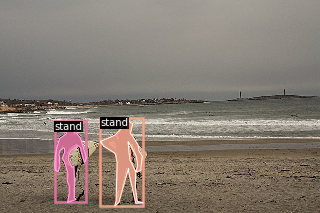

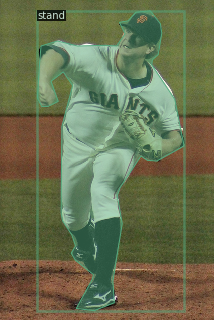

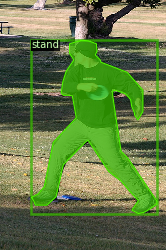

In [ ]:
import random

for d in random.sample(train_dicts, 3):
    # print(d)
    img = cv2.imread(d["file_name"]) #Start at 7 due to script name mismatch
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

Now, let's fine-tune a coco-pretrained R50-FPN Mask R-CNN model on the fruits_nuts dataset. It takes ~6 minutes to train 300 iterations on Colab's K80 GPU.


In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file("./detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.DATASETS.TRAIN = ("rel_actions1",)
cfg.DATASETS.TEST = ()   # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.002
cfg.SOLVER.MAX_ITER = 1000    
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(relevant_classes)  # all relevant classes
cfg.OUTPUT_DIR = "./outputs/action_only_detector"

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[05/08 23:44:11 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:12, 14.6MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (28, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (28,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to

[05/08 23:44:30 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[05/08 23:44:45 d2.utils.events]:  eta: 0:11:46  iter: 19  total_loss: 3.509  loss_cls: 2.275  loss_box_reg: 0.5488  loss_mask: 0.6903  loss_rpn_cls: 0.03365  loss_rpn_loc: 0.004783  time: 0.6797  data_time: 0.4443  lr: 3.9962e-05  max_mem: 2545M
[05/08 23:44:59 d2.utils.events]:  eta: 0:11:25  iter: 39  total_loss: 2.852  loss_cls: 1.574  loss_box_reg: 0.5157  loss_mask: 0.6691  loss_rpn_cls: 0.02743  loss_rpn_loc: 0.004821  time: 0.6894  data_time: 0.4270  lr: 7.9922e-05  max_mem: 2545M
[05/08 23:45:14 d2.utils.events]:  eta: 0:11:12  iter: 59  total_loss: 1.92  loss_cls: 0.7083  loss_box_reg: 0.5131  loss_mask: 0.6261  loss_rpn_cls: 0.01519  loss_rpn_loc: 0.005434  time: 0.7122  data_time: 0.4793  lr: 0.00011988  max_mem: 2545M
[05/08 23:45:28 d2.utils.events]:  eta: 0:10:55  iter: 79  total_loss: 1.858  loss_cls: 0.5534  loss_box_reg: 0.6597  loss_mask: 0.5698  loss_rpn_cls: 0.01562  loss_rpn_loc: 0.00593  time: 0.7083  data_time: 0.4169  lr: 0.00015984  max_mem: 2545M
[05/08 23:45

Now, we perform inference with the trained model on the fruits_nuts dataset. First, let's create a predictor using the model we just trained:



### Run Eval Metrics for 0.5

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("rel_actions_val3", )
predictor = DefaultPredictor(cfg)

[05/09 00:15:16 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

Then, we randomly select several samples to visualize the prediction results.

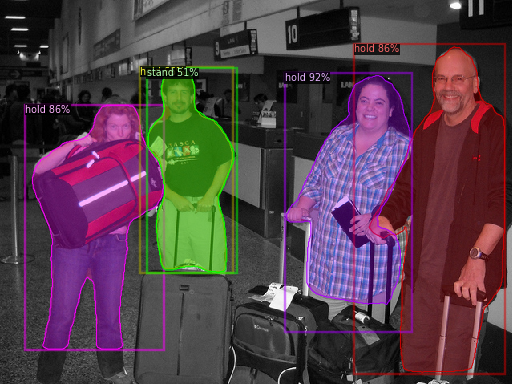

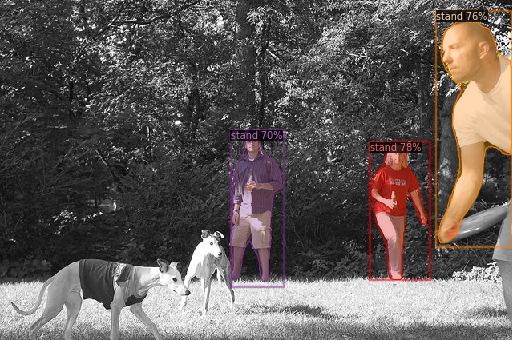

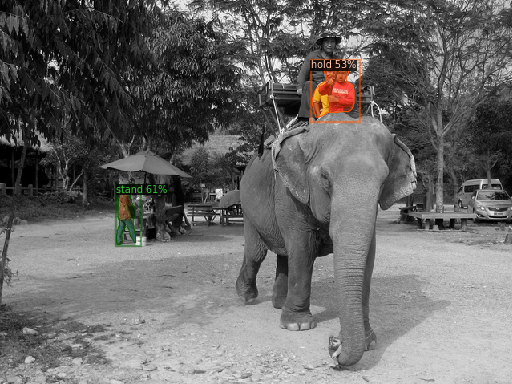

In [ ]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(train_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=train_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.engine import DefaultTrainer

evaluator = COCOEvaluator("rel_actions_val3", cfg, False, output_dir="./output_evals/")
val_loader = build_detection_test_loader(cfg, "rel_actions_val3")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [05/09 00:15:25 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[05/09 00:15:25 d2.data.datasets.coco]: Loaded 2215 images in COCO format from ./data/instances_vcoco_actions_val_2014.json
[05/09 00:15:26 d2.data.build]: Distribution of instances among all 7 categories:
|   category    | #instances   |  category  | #instances   |  category  | #instances   |
|:-------------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|     hold      | 2163         |   carry    | 262          |   point    | 23           |
|      eat      | 376          |   drink    | 70           |   stand    | 2448         |
| talk_on_phone | 187          |            |              |            |              |
|     total     | 5529         |            |              |            |              |
[05/09 00:15:26 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: 

OrderedDict([('bbox',
              {'AP': 12.054746090751948,
               'AP-carry': 0.0,
               'AP-drink': 0.0,
               'AP-eat': 1.653387355812205,
               'AP-hold': 40.04496914199544,
               'AP-point': 0.0,
               'AP-stand': 42.684866137455984,
               'AP-talk_on_phone': 0.0,
               'AP50': 19.171166864176435,
               'AP75': 13.44908209568981,
               'APl': 11.992233646442443,
               'APm': 16.956725039905564,
               'APs': 50.0}),
             ('segm',
              {'AP': 11.215705604418499,
               'AP-carry': 0.0,
               'AP-drink': 0.0,
               'AP-eat': 2.033828393624494,
               'AP-hold': 34.786599491454645,
               'AP-point': 0.0,
               'AP-stand': 41.68951134585036,
               'AP-talk_on_phone': 0.0,
               'AP50': 18.607357993512416,
               'AP75': 12.624930670282072,
               'APl': 12.54704110216769,
    

### Run Eval Metrics for 0.4

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.4   # set the testing threshold for this model
cfg.DATASETS.TEST = ("rel_actions_val3", )
predictor = DefaultPredictor(cfg)

[05/09 00:31:05 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.engine import DefaultTrainer

evaluator = COCOEvaluator("rel_actions_val3", cfg, False, output_dir="./output_evals/")
val_loader = build_detection_test_loader(cfg, "rel_actions_val3")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [05/09 00:32:15 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[05/09 00:32:15 d2.data.datasets.coco]: Loaded 2215 images in COCO format from ./data/instances_vcoco_actions_val_2014.json
[05/09 00:32:15 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/09 00:32:15 d2.data.common]: Serializing 2215 elements to byte tensors and concatenating them all ...
[05/09 00:32:15 d2.data.common]: Serialized dataset takes 5.66 MiB
[05/09 00:32:15 d2.evaluation.evaluator]: Start inference on 2215 batches
[05/09 00:32:16 d2.evaluation.evaluator]: Inference done 11/2215. Dataloading: 0.0017 s/iter. Inference: 0.0679 s/iter. Eval: 0.0063 s/iter. Total: 0.0759 s/iter. ETA=0:02:47
[05/09 00:32:21 d2.evaluation.evaluator]: Inference done 73/2215. Dataloading: 0.0022 s/iter. Inference: 

OrderedDict([('bbox',
              {'AP': 12.054746090751948,
               'AP-carry': 0.0,
               'AP-drink': 0.0,
               'AP-eat': 1.653387355812205,
               'AP-hold': 40.04496914199544,
               'AP-point': 0.0,
               'AP-stand': 42.684866137455984,
               'AP-talk_on_phone': 0.0,
               'AP50': 19.171166864176435,
               'AP75': 13.44908209568981,
               'APl': 11.992233646442443,
               'APm': 16.956725039905564,
               'APs': 50.0}),
             ('segm',
              {'AP': 11.215705604418499,
               'AP-carry': 0.0,
               'AP-drink': 0.0,
               'AP-eat': 2.033828393624494,
               'AP-hold': 34.786599491454645,
               'AP-point': 0.0,
               'AP-stand': 41.68951134585036,
               'AP-talk_on_phone': 0.0,
               'AP50': 18.607357993512416,
               'AP75': 12.624930670282072,
               'APl': 12.54704110216769,
    

# Train on Faster RCNN Model
COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

from detectron2 import model_zoo

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("rel_actions1",)
cfg.DATASETS.TEST = ()   # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.002
cfg.SOLVER.MAX_ITER = 1000    
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(relevant_classes)  # all relevant classes
cfg.OUTPUT_DIR = "./outputs/action_only_detector"

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[05/09 00:48:15 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:20, 8.06MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (28, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (28,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_p

[05/09 00:48:36 d2.engine.train_loop]: Starting training from iteration 0
[05/09 00:48:42 d2.utils.events]:  eta: 0:04:03  iter: 19  total_loss: 2.62  loss_cls: 2.017  loss_box_reg: 0.5686  loss_rpn_cls: 0.0201  loss_rpn_loc: 0.00475  time: 0.2523  data_time: 0.0253  lr: 3.9962e-05  max_mem: 2758M
[05/09 00:48:47 d2.utils.events]:  eta: 0:04:04  iter: 39  total_loss: 2.04  loss_cls: 1.369  loss_box_reg: 0.6559  loss_rpn_cls: 0.02173  loss_rpn_loc: 0.00415  time: 0.2630  data_time: 0.0128  lr: 7.9922e-05  max_mem: 2806M
[05/09 00:48:53 d2.utils.events]:  eta: 0:04:03  iter: 59  total_loss: 1.361  loss_cls: 0.7126  loss_box_reg: 0.5817  loss_rpn_cls: 0.01871  loss_rpn_loc: 0.005755  time: 0.2667  data_time: 0.0162  lr: 0.00011988  max_mem: 2806M
[05/09 00:48:58 d2.utils.events]:  eta: 0:04:00  iter: 79  total_loss: 1.053  loss_cls: 0.4737  loss_box_reg: 0.5136  loss_rpn_cls: 0.01666  loss_rpn_loc: 0.003539  time: 0.2644  data_time: 0.0147  lr: 0.00015984  max_mem: 2806M
[05/09 00:49:04 d

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("rel_actions_val3", )
predictor = DefaultPredictor(cfg)

[05/09 00:53:21 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.engine import DefaultTrainer

evaluator = COCOEvaluator("rel_actions_val3", cfg, False, output_dir="./output_evals/")
val_loader = build_detection_test_loader(cfg, "rel_actions_val3")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [05/09 00:53:28 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[05/09 00:53:28 d2.data.datasets.coco]: Loaded 2215 images in COCO format from ./data/instances_vcoco_actions_val_2014.json
[05/09 00:53:29 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/09 00:53:29 d2.data.common]: Serializing 2215 elements to byte tensors and concatenating them all ...
[05/09 00:53:29 d2.data.common]: Serialized dataset takes 5.66 MiB
[05/09 00:53:29 d2.evaluation.evaluator]: Start inference on 2215 batches
[05/09 00:53:30 d2.evaluation.evaluator]: Inference done 11/2215. Dataloading: 0.0016 s/iter. Inference: 0.0630 s/iter. Eval: 0.0003 s/iter. Total: 0.0649 s/iter. ETA=0:02:22
[05/09 00:53:35 d2.evaluation.evaluator]: Inference done 84/2215. Dataloading: 0.0022 s/iter. Inference: 

OrderedDict([('bbox',
              {'AP': 10.818063676259921,
               'AP-carry': 0.0,
               'AP-drink': 0.0,
               'AP-eat': 0.4225658325436689,
               'AP-hold': 39.87349445213421,
               'AP-point': 0.0,
               'AP-stand': 35.43038544914159,
               'AP-talk_on_phone': 0.0,
               'AP50': 16.964607948315617,
               'AP75': 12.391597443236359,
               'APl': 11.429539806129627,
               'APm': 15.231991371583723,
               'APs': 50.0})])

# Train on Retinent Model 50

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

from detectron2 import model_zoo

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("rel_actions1",)
cfg.DATASETS.TEST = ()   # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_101_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.002
cfg.SOLVER.MAX_ITER = 1000    
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset
# cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(relevant_classes)  # all relevant classes
cfg.MODEL.RETINANET.NUM_CLASSES = len(relevant_classes)
cfg.OUTPUT_DIR = "./outputs/action_only_detector"

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

Loading config /content/drive/.shortcut-targets-by-id/1Eg2dTJ9lloHImzZiTfOZ7_jOP1sTh--c/6.869 Project/v-coco/detectron2_repo/detectron2/model_zoo/configs/COCO-Detection/../Base-RetinaNet.yaml with yaml.unsafe_load. Your machine may be at risk if the file contains malicious content.


[05/09 01:02:54 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

model_final_971ab9.pkl: 228MB [00:17, 12.8MB/s]                           
Skip loading parameter 'head.cls_score.weight' to the model due to incompatible shapes: (720, 256, 3, 3) in the checkpoint but (63, 256, 3, 3) in the model! You might want to double check if this is expected.
Skip loading parameter 'head.cls_score.bias' to the model due to incompatible shapes: (720,) in the checkpoint but (63,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
head.cls_score.{bias, weight}
The checkpoint state_dict contains keys that are not used by the model:
  pixel_mean
  pixel_std


[05/09 01:03:13 d2.engine.train_loop]: Starting training from iteration 0
[05/09 01:03:27 d2.utils.events]:  eta: 0:06:35  iter: 19  total_loss: 1.291  loss_cls: 1.149  loss_box_reg: 0.09464  time: 0.7037  data_time: 0.0223  lr: 3.9962e-05  max_mem: 3138M
[05/09 01:03:34 d2.utils.events]:  eta: 0:05:57  iter: 39  total_loss: 1.104  loss_cls: 0.9954  loss_box_reg: 0.0798  time: 0.5247  data_time: 0.0123  lr: 7.9922e-05  max_mem: 3138M
[05/09 01:03:41 d2.utils.events]:  eta: 0:05:41  iter: 59  total_loss: 0.9339  loss_cls: 0.8588  loss_box_reg: 0.07811  time: 0.4640  data_time: 0.0104  lr: 0.00011988  max_mem: 3138M
[05/09 01:03:48 d2.utils.events]:  eta: 0:05:34  iter: 79  total_loss: 0.8149  loss_cls: 0.7471  loss_box_reg: 0.08631  time: 0.4387  data_time: 0.0119  lr: 0.00015984  max_mem: 3138M
[05/09 01:03:56 d2.utils.events]:  eta: 0:05:27  iter: 99  total_loss: 0.5795  loss_cls: 0.4521  loss_box_reg: 0.1185  time: 0.4256  data_time: 0.0115  lr: 0.0001998  max_mem: 3138M
[05/09 01:04

In [49]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
# cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5
cfg.DATASETS.TEST = ("rel_actions_val3", )
predictor = DefaultPredictor(cfg)

[05/09 01:26:08 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                       | Names in Checkpoint                                                                                  | Shapes                                          |
|:-------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*    | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*    | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*    | backbone.bottom_up.res2.0.conv3.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.engine import DefaultTrainer

evaluator = COCOEvaluator("rel_actions_val3", cfg, False, output_dir="./output_evals/")
val_loader = build_detection_test_loader(cfg, "rel_actions_val3")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [05/09 01:10:24 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[05/09 01:10:24 d2.data.datasets.coco]: Loaded 2215 images in COCO format from ./data/instances_vcoco_actions_val_2014.json
[05/09 01:10:24 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/09 01:10:24 d2.data.common]: Serializing 2215 elements to byte tensors and concatenating them all ...
[05/09 01:10:25 d2.data.common]: Serialized dataset takes 5.66 MiB
[05/09 01:10:25 d2.evaluation.evaluator]: Start inference on 2215 batches
[05/09 01:10:26 d2.evaluation.evaluator]: Inference done 11/2215. Dataloading: 0.0016 s/iter. Inference: 0.0780 s/iter. Eval: 0.0004 s/iter. Total: 0.0800 s/iter. ETA=0:02:56
[05/09 01:10:31 d2.evaluation.evaluator]: Inference done 69/2215. Dataloading: 0.0025 s/iter. Inference: 

OrderedDict([('bbox',
              {'AP': 14.973408472126575,
               'AP-carry': 5.420342633782121,
               'AP-drink': 0.0,
               'AP-eat': 12.512506011482463,
               'AP-hold': 37.9474266183727,
               'AP-point': 0.0,
               'AP-stand': 48.933584041248736,
               'AP-talk_on_phone': 0.0,
               'AP50': 22.974768706425476,
               'AP75': 16.64620894499706,
               'APl': 14.828050762899277,
               'APm': 18.308672603489068,
               'APs': 70.0})])

## Run Action on Images

In [ ]:
%ls ../GroceryImages

image01.jpeg  image07.jpeg  image13.jpeg  image40.jpeg  image46.jpeg
image02.jpeg  image08.jpeg  image14.jpeg  image41.jpeg  image47.jpeg
image03.jpeg  image09.png   image36.jpeg  image42.jpeg  image48.jpeg
image04.jpeg  image10.jpeg  image37.jpeg  image43.jpeg  image49.jpeg
image05.jpeg  image11.png   image38.jpeg  image44.jpeg  image50.jpeg
image06.png   image12.jpeg  image39.jpeg  image45.jpeg


In [ ]:
image_list = ['image01.jpeg', 'image02.jpeg', 'image03.jpeg', 'image04.jpeg', 'image05.jpeg', 'image06.png', 'image07.jpeg', 'image08.jpeg', 'image09.png', 'image10.jpeg', 'image11.png', 'image12.jpeg', 'image13.jpeg', 'image14.jpeg', 'image36.jpeg', 'image37.jpeg', 'image38.jpeg', 'image39.jpeg', 'image40.jpeg', 'image41.jpeg', 'image42.jpeg', 'image43.jpeg', 'image44.jpeg', 'image45.jpeg', 'image46.jpeg', 'image47.jpeg', 'image48.jpeg', 'image49.jpeg', 'image50.jpeg']


image01.jpeg


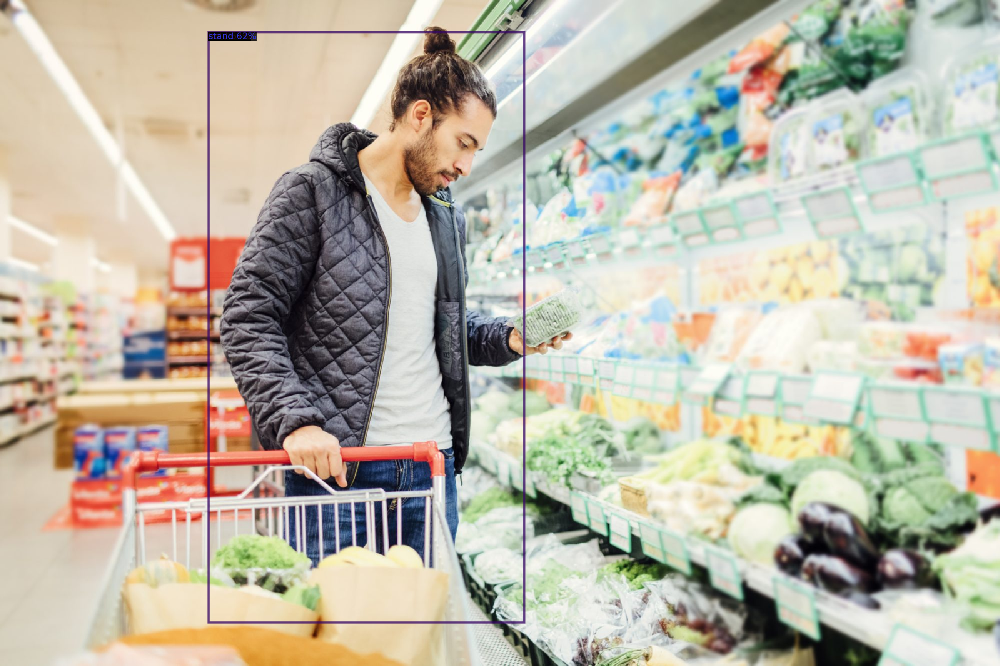

image02.jpeg


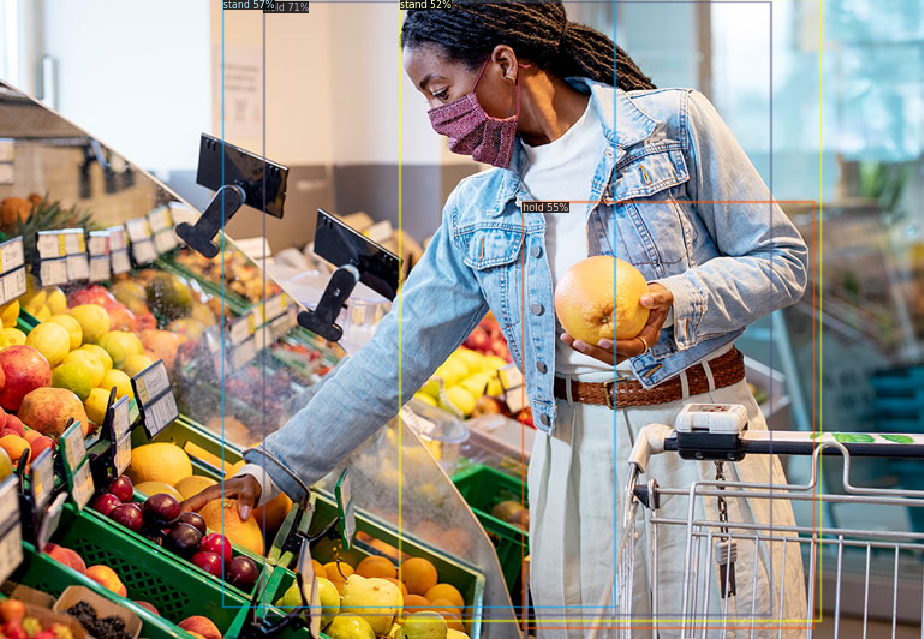

image03.jpeg


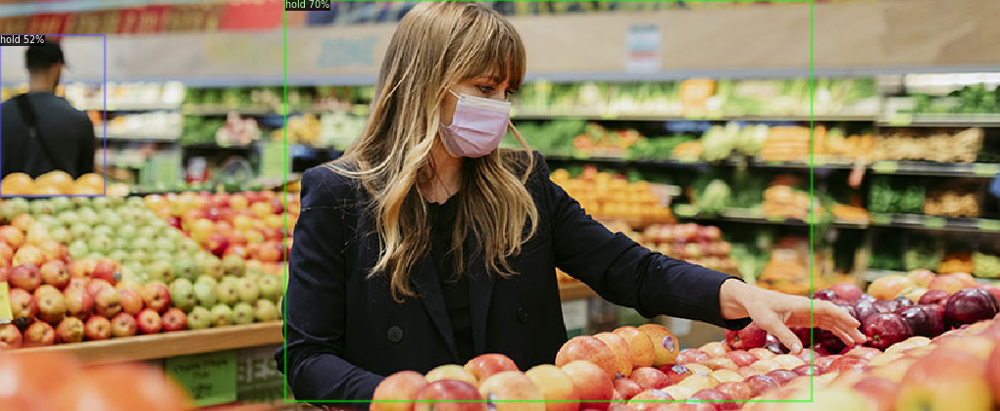

image04.jpeg


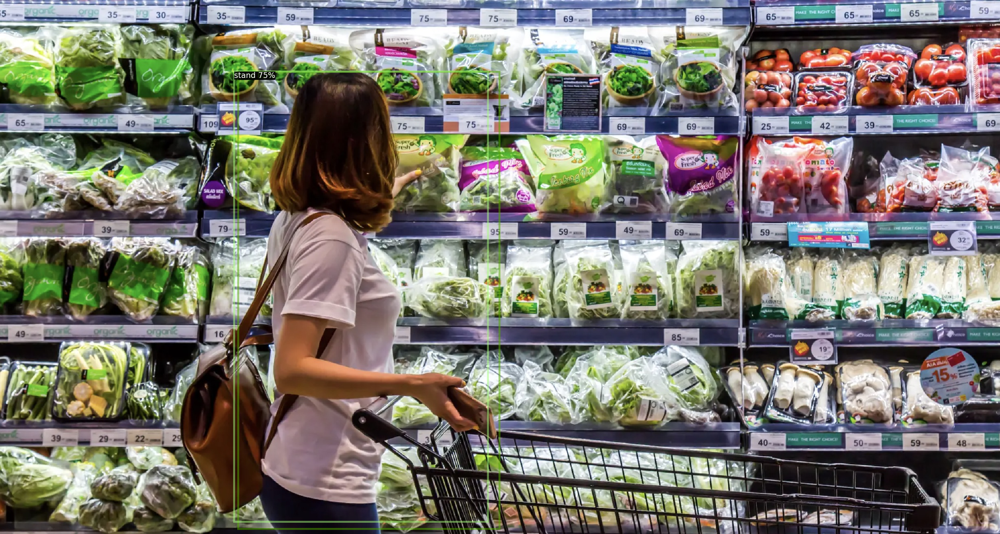

image05.jpeg


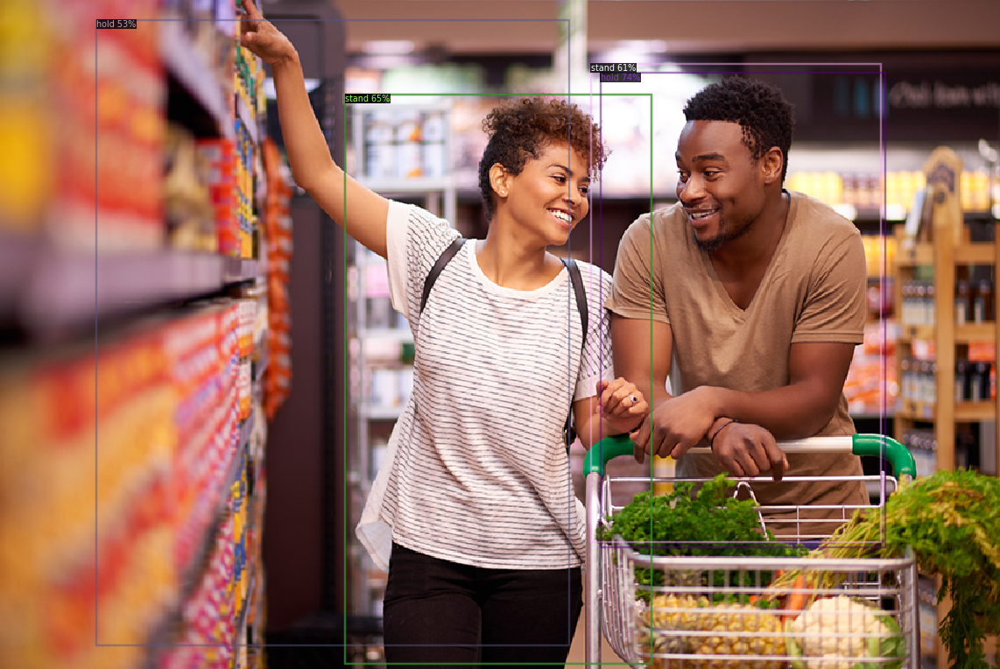

image06.png


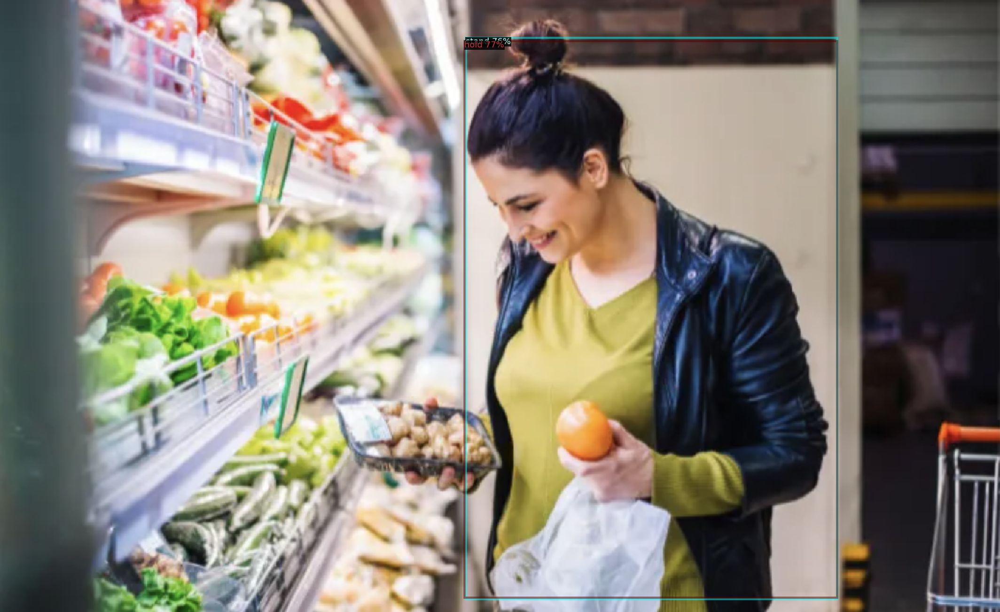

In [ ]:
for i in image_list:
  im = cv2.imread(f"../GroceryImages/{i}")
  print(i)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
  out.save(f"../sandbox/annotated_shopping/action_only_model/{i}")